# Stats - absolute anomalies, seasonal

$$
z_{anomaly} = \frac{1}{30} \displaystyle\sum_{y=1}^{30}
(\bar{x}_y - \bar{x}_{hist})\ (\textrm{kg DM ha}^{-1})
$$

- calculate annual means (or seasonal means for each year)
- calculate the historical mean from the annual means
- calculate difference
- interannual reduction
- ensemble reduction

In [1]:
import importlib
import climag.climag as cplt
import geopandas as gpd
import os
import numpy as np

In [2]:
# mask for offshore areas
ie_bbox = gpd.read_file(
    os.path.join("data", "boundaries", "boundaries_all.gpkg"),
    layer="ne_10m_land_2157_IE_BBOX_DIFF",
)
# mask for non-pasture areas
mask = gpd.read_file(
    os.path.join("data", "boundaries", "boundaries_all.gpkg"),
    layer="CLC_2018_MASK_PASTURE_2157_IE",
)
# pasture areas for clipping prior to calculating stats
pastures = gpd.read_file(
    os.path.join("data", "landcover", "clc-2018-pasture.gpkg"),
    layer="dissolved",
)["geometry"]

In [24]:
importlib.reload(cplt)

<module 'climag.climag' from '/mnt/Backup/Documents/Git/ClimAg/ClimAg/climag/climag.py'>

## EURO-CORDEX

In [3]:
ds_ec = cplt.load_all_data("EURO-CORDEX")

/mnt/Backup/Documents/Git/ClimAg/ClimAg/.venv/lib/python3.11/site-packages/gribapi/__init__.py:23: UserWarning: ecCodes 2.31.0 or higher is recommended. You are running version 2.24.2
  warnings.warn(
<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject


In [4]:
ds_ec_norm = cplt.calc_anomaly_absolute(ds_ec, seasonal=True, skipna=True)

In [5]:
# get interannual mean, and then the ensemble mean
ds_ec_norm_reduced = ds_ec_norm.mean(dim="year", skipna=True).mean(
    dim="model", skipna=True
)

In [9]:
cplt.describe_dataset(ds_ec_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, xrdataset=False)

,gro
count,5280.000000
mean,0.731451
std,5.282363
min,-18.504541
25%,-2.392606
50%,0.363226
75%,2.452544
max,20.549629


In [10]:
cplt.describe_dataset(ds_ec_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, season=True, xrdataset=False)

season             DJF          JJA          MAM          SON
gro count  1320.000000  1320.000000  1320.000000  1320.000000
    mean      0.585048    -4.641705     8.026265    -1.043806
    std       0.356012     3.121116     3.546838     1.976364
    min      -0.243428   -18.504541    -1.725458    -7.996857
    25%       0.369953    -6.552388     5.697736    -2.346369
    50%       0.538977    -4.375240     7.718404    -1.063384
    75%       0.761482    -2.436063    10.183480     0.239473
    max       3.585046     2.735913    20.549629     6.530748

In [11]:
cplt.describe_dataset(ds_ec_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, exp=True, xrdataset=False)

exp              rcp45        rcp85
gro count  2640.000000  2640.000000
    mean      0.704956     0.757945
    std       4.019745     6.297424
    min     -10.790942   -18.504541
    25%      -1.753074    -3.275509
    50%       0.327527     0.425027
    75%       2.139596     2.910004
    max      14.151862    20.549629

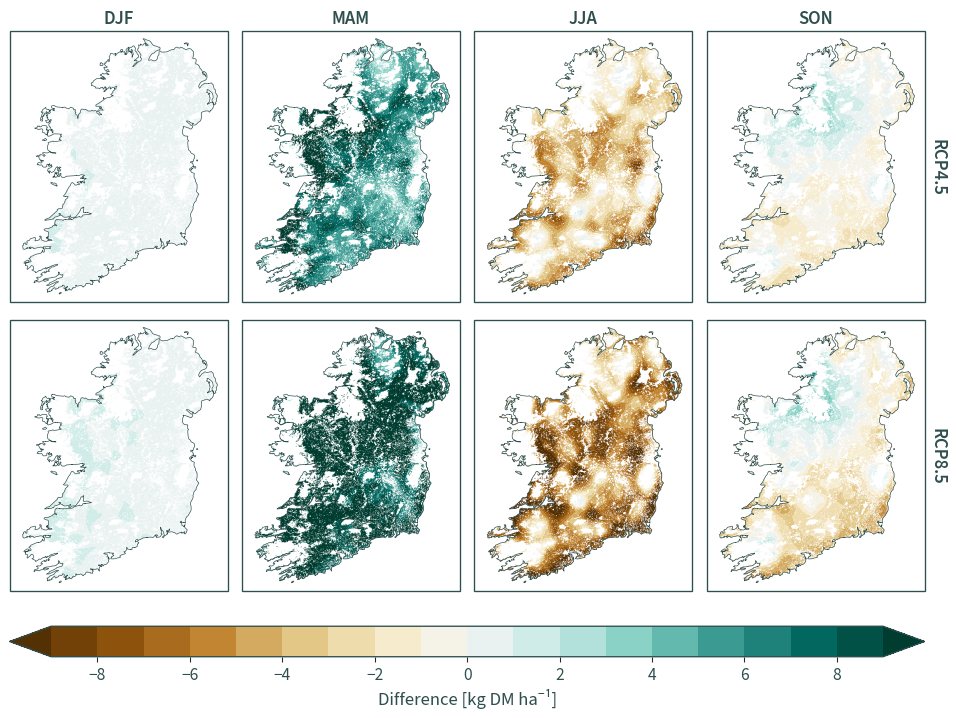

In [28]:
cplt.plot_stats(ds_ec_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], cplt.projection_eurocordex, mask, ie_bbox, label="Difference [kg DM ha⁻¹]", row="exp", col="season", levels=np.arange(-9, 9 + 1, 1)
)

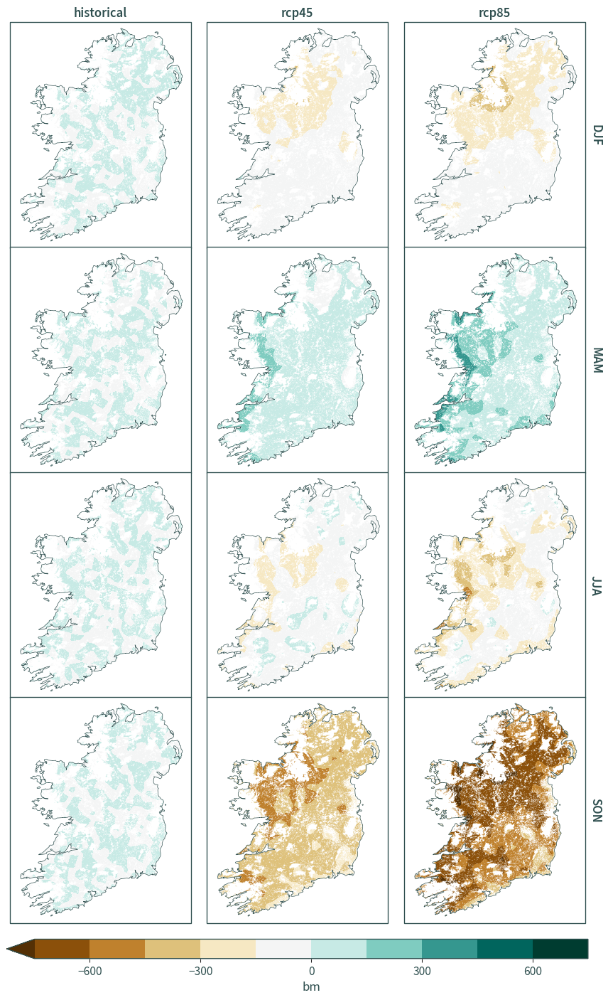

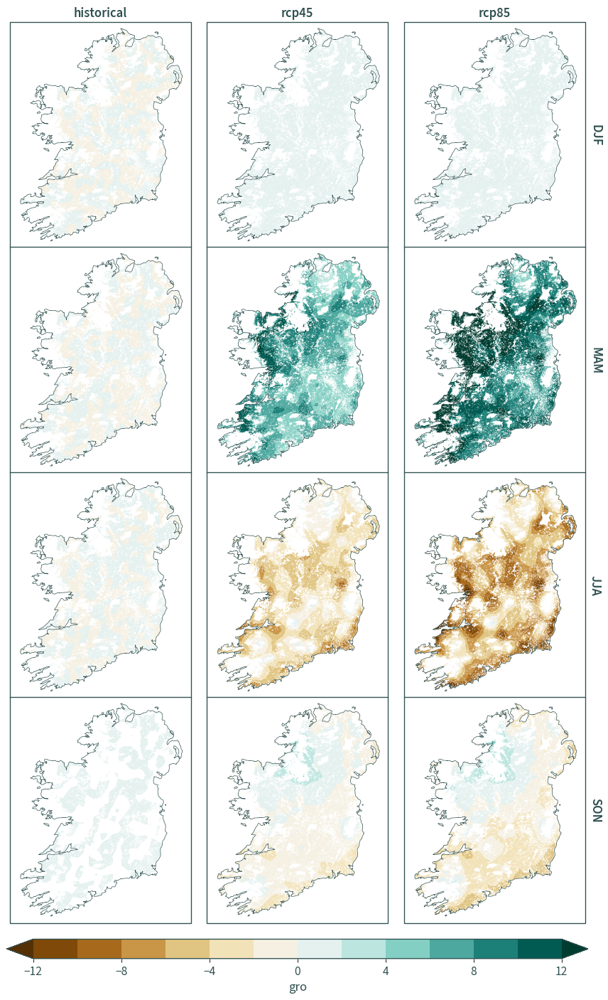

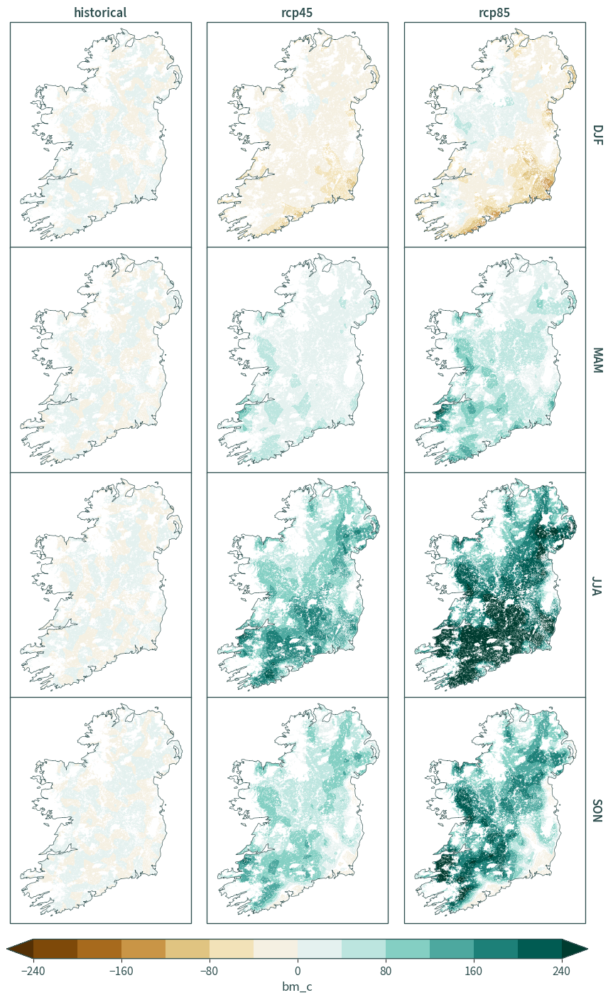

In [5]:
cplt.plot_stats(ds_ec_norm_reduced, cplt.projection_eurocordex, mask, ie_bbox, row="season")

## HiResIreland

In [12]:
ds_hr = cplt.load_all_data("HiResIreland")

In [13]:
ds_hr_norm = cplt.calc_anomaly_absolute(ds_hr, seasonal=True, skipna=True)

In [14]:
ds_hr_norm_reduced = ds_hr_norm.mean(dim="year", skipna=True).mean(
    dim="model", skipna=True
)

In [16]:
cplt.describe_dataset(ds_hr_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, xrdataset=False)

,gro
count,43344.000000
mean,-0.916770
std,3.447152
min,-14.931471
25%,-3.329918
50%,0.129499
75%,0.733942
max,11.807607


In [15]:
cplt.describe_dataset(ds_hr_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, exp=True, xrdataset=False)

exp               rcp45         rcp85
gro count  21672.000000  21672.000000
    mean      -0.809177     -1.024364
    std        3.021112      3.823086
    min       -9.654009    -14.931471
    25%       -2.305066     -3.625553
    50%        0.157899      0.000000
    75%        0.800942      0.678587
    max        8.132420     11.807607

In [17]:
cplt.describe_dataset(ds_hr_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], pastures, season=True, xrdataset=False)

season              DJF           JJA           MAM           SON
gro count  10836.000000  10836.000000  10836.000000  10836.000000
    mean       0.301057     -5.595499      3.056601     -1.429240
    std        0.146508      1.800060      1.663409      1.441717
    min       -0.264111    -14.931471     -0.925498     -9.569889
    25%        0.219321     -6.539636      1.970353     -2.442328
    50%        0.296981     -5.626832      2.855968     -1.323536
    75%        0.379240     -4.635834      3.970590     -0.439891
    max        1.415712      0.682802     11.807607      4.039833

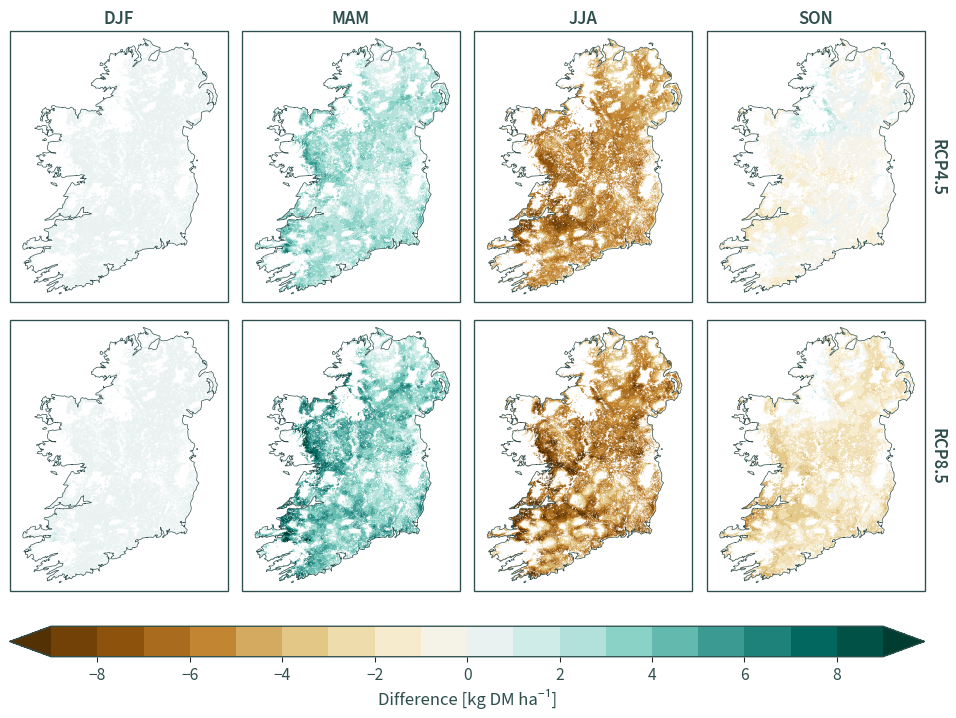

In [27]:
cplt.plot_stats(ds_hr_norm_reduced.sel(exp=["rcp45", "rcp85"])["gro"], cplt.projection_hiresireland, mask, ie_bbox, label="Difference [kg DM ha⁻¹]", row="exp", col="season", levels=np.arange(-9, 9 + 1, 1)
)

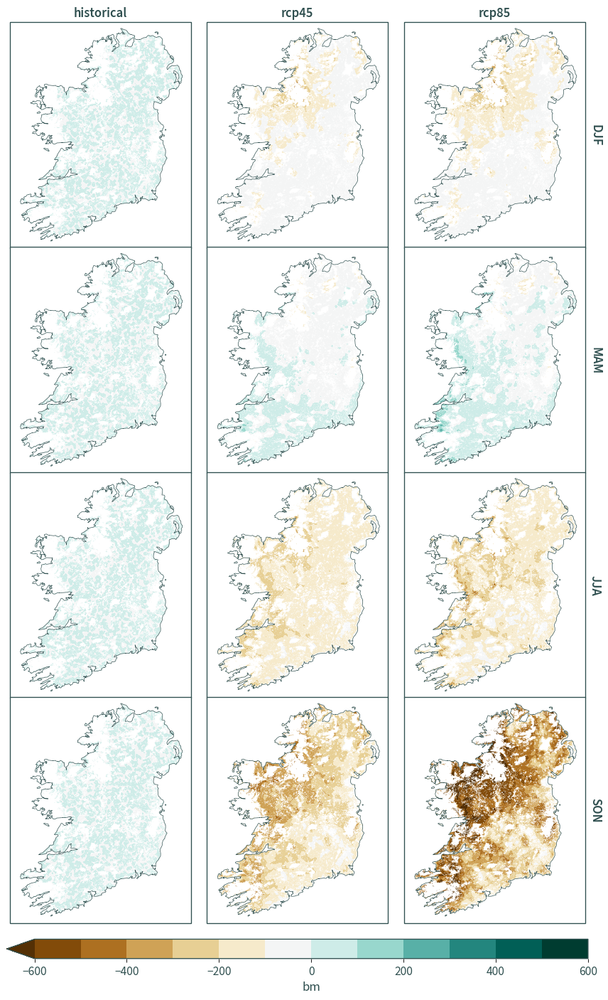

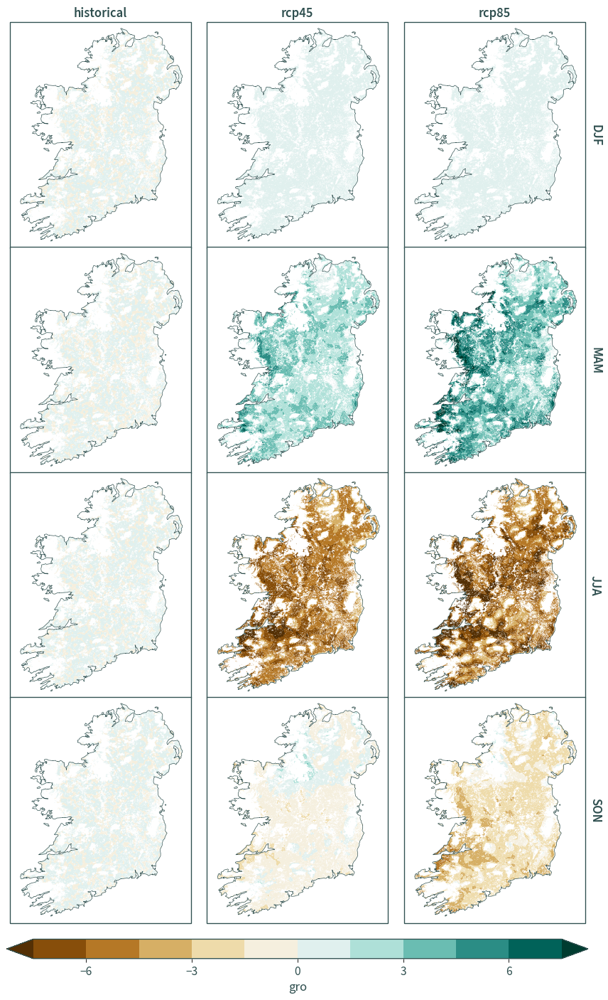

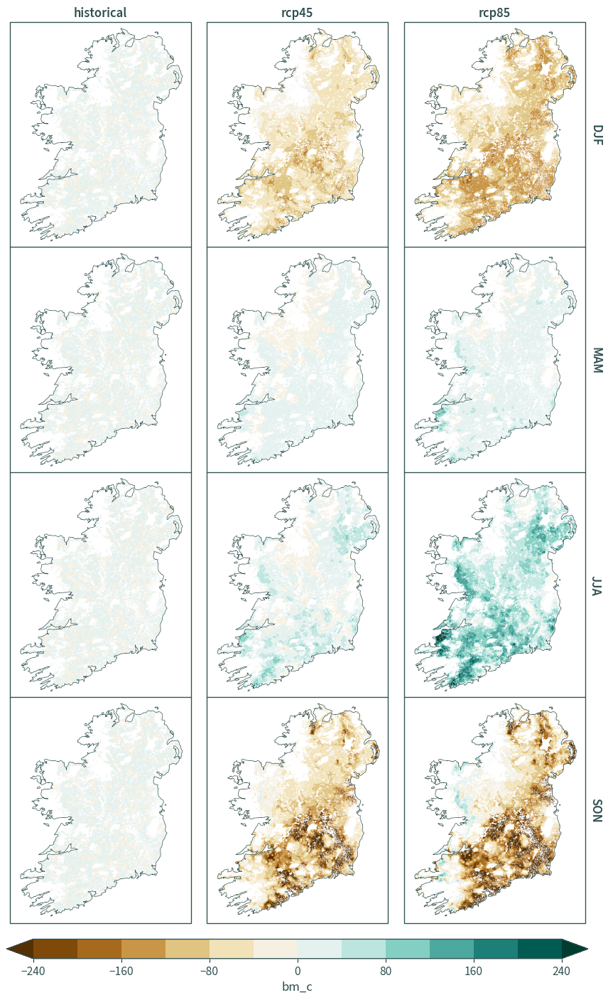

In [6]:
cplt.plot_stats(
    ds_hr_norm_reduced, cplt.projection_hiresireland, mask, ie_bbox, row="season"
)